# Collect spatial data

Created by 
* [Li, Chaonan (李超男)](https://www.researchgate.net/profile/Chaonan-Li-5) / licn@mtc.edu.cn / [Ecological Security and Protection Key Laboratory of Sichuan Province, Mianyang Normal University](https://zdsys.mtc.edu.cn/)
* Liao, Haijun (廖海君) / liaohj@mtc.edu.cn /
[Engineering Research Center of Chuanxibei RHS Construction at Mianyang Normal University of Sichuan Province](https://rhs.mtc.edu.cn/)

Reviewed by [Li, Xiangzhen (李香真)](https://www.researchgate.net/profile/Xiangzhen-Li-2) / lixz@fafu.edu.cn /
[College of Resources and Environment, Fujian Agriculture and Forestry University](https://zhxy.fafu.edu.cn/main.htm)

Analyzing the spatial patterns of microbial traits also poses a significant challenge due to the limited availability of environmental data that correspond to microbiome data, and this dearth of paired datasets is particularly prevalent in the majority of currently accessible public repositories. The [geodata](https://github.com/rspatial/geodata) R package provides some method to download spatial, climate and soil properties from public repositories, and the [MODIS](https://modis.gsfc.nasa.gov/) host many remote-sense images of plant metrics and land cover. To a certain extent, this mitigates the difficult of limited environmental data, though the accuracy of their absolute values is relatively lower compared to those measured ones. 

Yet, it is extremely challenging for most R language beginners to effectively integrate these datasets for microbial biogeography analysis, as the whole process involves manipulating diverse datasets. To solve this problem, we designed a series of functions to download various spatial, climate, vegetation, and soil parameters from public repositories. Although the accuracy of these datasets are lower than that of measured ones, they can still be associated with microbial biogeographical features at a larger spatial scale.

**Please note that all spatial data would be resampled to a same spatial resolution based on the first downloaded SpatRaster!**

Now, let's go through each of these functions and see how to download public environmental properties from public repositories.

## Load required R packages

Here we need four R packages for this section of microgeo R package tutorial. Just run the following codes to import them into R environment.

In [1]:
# Install and load `magrittr`, `ggplot2`, `devtools` and `microgeo` packages 
if (!suppressMessages(require(magrittr))) install.packages("magrittr")
if (!require(ggplot2)  %>% suppressMessages) install.packages("ggplot2")
if (!require(devtools) %>% suppressMessages) install.packages("devtools")
if (!require(microgeo) %>% suppressMessages) devtools::install_github("ChaonanLi/microgeo")

## Create a standard microgeo dataset

We also need a standard microgeo dataset for the presentations in the section of tutorial.

In [2]:
# Example by using the map downloaded from the DataV.GeoAtlas
data(qtp)
map <- read_aliyun_map(adcode = c(540000, 630000, 510000)) %>% suppressMessages() 
dataset.dts.aliyun <- create_dataset(mat = qtp$asv, ant = qtp$tax, met = qtp$met, map = map,
                                     phy = qtp$tre, env = qtp$env, lon = "longitude", lat = "latitude") 
dataset.dts.aliyun %>% show_dataset()

ℹ [2023-10-12 10:49:47] INFO ==> all samples fall within the map area!

ℹ [2023-10-12 10:49:47] INFO ==> dataset has been created successfully!

ℹ [2023-10-12 10:49:47] INFO ==> use `object %>% show_dataset()` to check the summary of dataset.



── The Summary of Microgeo Dataset ─────────────────────────────────────────────


! object$mat: 6808 ASVs/genes and 1244 samples [need to be subsampled!]

ℹ object$ant: 6808 ASVs/genes and 7 annotation levels (Kingdom, Phylum, Class, Order, Family, Genus, Species)

ℹ object$met: 1244 samples and 2 variables (longitude, latitude)

ℹ object$map: a SpatialPolygonsDataFrame with the CRS of '+proj=longlat +datum=WGS84 +no_defs'

ℹ object$phy: a phylogenetic tree with 6808 tip labels

ℹ object$env: 1244 samples and 10 variables




• To check the summary of dataset, Replace `object` with the variable name of your dataset
• For example, if the variable name is `dataset.dts`you can run `head(dataset.dts$met)` to check the content of `met`


## Collect the aridity index

The `get_ai()` is implemented to download aridity index from [global aridity index database](https://figshare.com/articles/dataset/Global_Aridity_Index_and_Potential_Evapotranspiration_ET0_Climate_Database_v2/7504448/3). The resolution of original data is 30''. Here is a simple example.

In [3]:
# Download aridity index for research area 
dataset.dts.aliyun %<>% get_ai(out.dir = "../test/microgeo_data")

✔ [2023-10-12 10:49:52] SAVE ==> new results have been saved to: object$spa$rast$his$AI



In [4]:
# Show dataset 
dataset.dts.aliyun %>% show_dataset()

── The Summary of Microgeo Dataset ─────────────────────────────────────────────


! object$mat: 6808 ASVs/genes and 1244 samples [need to be subsampled!]

ℹ object$ant: 6808 ASVs/genes and 7 annotation levels (Kingdom, Phylum, Class, Order, Family, Genus, Species)

ℹ object$met: 1244 samples and 2 variables (longitude, latitude)

ℹ object$map: a SpatialPolygonsDataFrame with the CRS of '+proj=longlat +datum=WGS84 +no_defs'

ℹ object$phy: a phylogenetic tree with 6808 tip labels

ℹ object$env: 1244 samples and 10 variables




── The Summary of Biogeographic Traits ─────────────────────────────────────────


✔ object$spa: 1 historically numeric variables; 0 historically classification variables; 0 groups of future climate data




• To check the summary of dataset, Replace `object` with the variable name of your dataset
• For example, if the variable name is `dataset.dts`you can run `head(dataset.dts$met)` to check the content of `met`


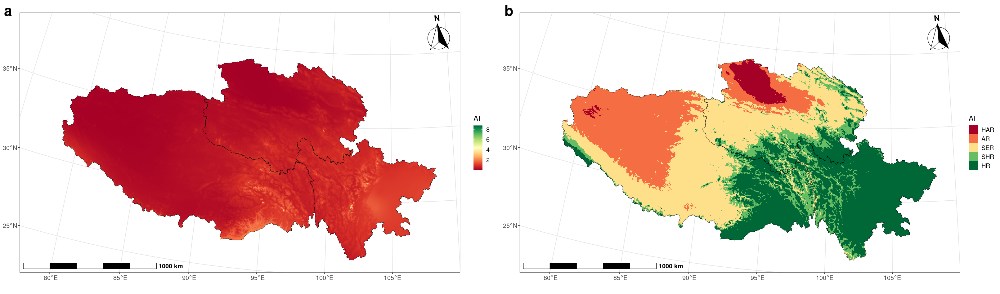

In [5]:
# Visualize the aridity index
options(repr.plot.width = 13.43 * 2, repr.plot.height = 7.9)
q1 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
    add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$AI, 
                   color = colorRampPalette(RColorBrewer::brewer.pal(11, "RdYlGn"))(100)) %>% 
    add_north_arrow() %>% add_scale_bar() %>% add_crs()
q2 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
   add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$AI, breaks = c(0.03, 0.2, 0.5, 0.65),
                  color = RColorBrewer::brewer.pal(11, "RdYlGn")[c(1,3,5,9,11)], labels = c("HAR", "AR", "SER", "SHR", "HR")) %>% 
   add_north_arrow() %>% add_scale_bar() %>% add_crs()
cowplot::plot_grid(q1, q2, align = 'hv', ncol = 2, labels = c("a", "b"), label_size = 28) %>% suppressWarnings()

## Collect the elevation

The `get_elev()` is implemented to download elevation data from [WorldClim](https://www.worldclim.org/) database version 2.1. You are allowed to specify a spatial resolution. Here is a simple example based on the resolution of 2.5'.

In [6]:
# Download elevation for research area 
dataset.dts.aliyun %<>% get_elev(res = 2.5, out.dir = "../test/microgeo_data") 

✔ [2023-10-12 10:50:01] SAVE ==> new results have been saved to: object$spa$rast$his$ELEV



In [7]:
# Show dataset 
dataset.dts.aliyun %>% show_dataset()

── The Summary of Microgeo Dataset ─────────────────────────────────────────────


! object$mat: 6808 ASVs/genes and 1244 samples [need to be subsampled!]

ℹ object$ant: 6808 ASVs/genes and 7 annotation levels (Kingdom, Phylum, Class, Order, Family, Genus, Species)

ℹ object$met: 1244 samples and 2 variables (longitude, latitude)

ℹ object$map: a SpatialPolygonsDataFrame with the CRS of '+proj=longlat +datum=WGS84 +no_defs'

ℹ object$phy: a phylogenetic tree with 6808 tip labels

ℹ object$env: 1244 samples and 10 variables




── The Summary of Biogeographic Traits ─────────────────────────────────────────


✔ object$spa: 2 historically numeric variables; 0 historically classification variables; 0 groups of future climate data




• To check the summary of dataset, Replace `object` with the variable name of your dataset
• For example, if the variable name is `dataset.dts`you can run `head(dataset.dts$met)` to check the content of `met`


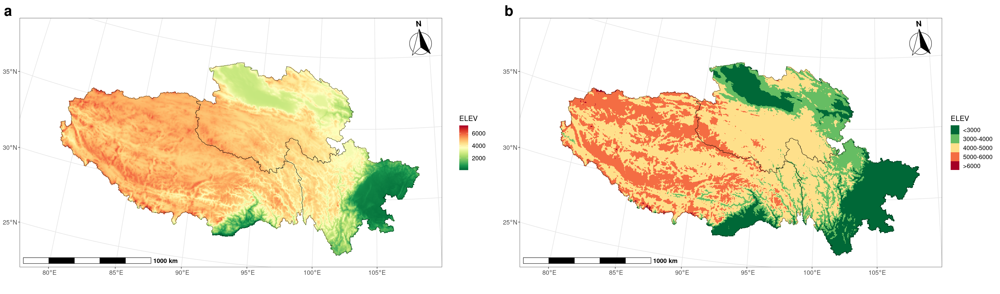

In [8]:
# Visualize the elevation
options(repr.plot.width = 13.43 * 2, repr.plot.height = 7.9)
q3 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
    add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$ELEV) %>% 
    add_north_arrow() %>% add_scale_bar() %>% add_crs()
q4 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
   add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$ELEV, breaks = c(3000, 4000, 5000, 6000), 
                  labels = c("<3000", "3000-4000", "4000-5000", "5000-6000", ">6000")) %>% 
   add_north_arrow() %>% add_scale_bar() %>% add_crs()
cowplot::plot_grid(q3, q4, align = 'hv', ncol = 2, labels = c("a", "b"), label_size = 28) %>% suppressWarnings()

## Collect the historical bioclimatic variables

The `get_his_bioc()` is implemented to download 19 historically bioclimatic variables from [WorldClim](https://www.worldclim.org/) database version 2.1. You are allowed to specify a spatial resolution. Here is a simple example based on the resolution of 2.5'.

In [9]:
# Download 19 historically bioclimatic variables of research area
dataset.dts.aliyun %<>% get_his_bioc(res = 2.5, out.dir = "../test/microgeo_data")

✔ [2023-10-12 10:50:23] SAVE ==> new results have been saved to: object$spa$rast$his(19 variables)



In [10]:
# Show dataset 
dataset.dts.aliyun %>% show_dataset()

── The Summary of Microgeo Dataset ─────────────────────────────────────────────


! object$mat: 6808 ASVs/genes and 1244 samples [need to be subsampled!]

ℹ object$ant: 6808 ASVs/genes and 7 annotation levels (Kingdom, Phylum, Class, Order, Family, Genus, Species)

ℹ object$met: 1244 samples and 2 variables (longitude, latitude)

ℹ object$map: a SpatialPolygonsDataFrame with the CRS of '+proj=longlat +datum=WGS84 +no_defs'

ℹ object$phy: a phylogenetic tree with 6808 tip labels

ℹ object$env: 1244 samples and 10 variables




── The Summary of Biogeographic Traits ─────────────────────────────────────────


✔ object$spa: 21 historically numeric variables; 0 historically classification variables; 0 groups of future climate data




• To check the summary of dataset, Replace `object` with the variable name of your dataset
• For example, if the variable name is `dataset.dts`you can run `head(dataset.dts$met)` to check the content of `met`


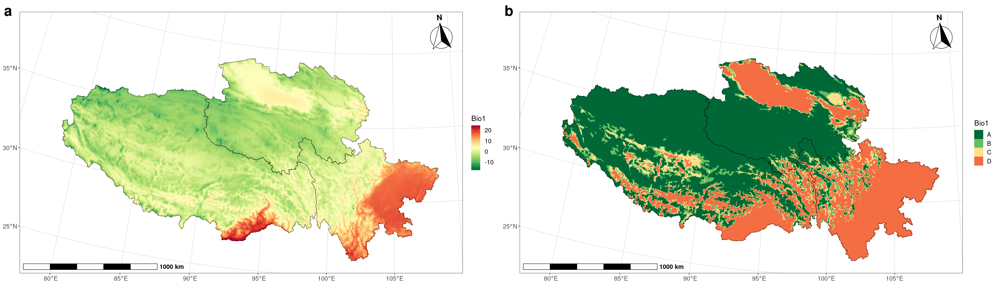

In [11]:
# Visualize the Bio1 (Mean annual temperature) 
options(repr.plot.width = 13.43 * 2, repr.plot.height = 7.9)
q5 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
    add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$Bio1) %>% 
    add_north_arrow() %>% add_scale_bar() %>% add_crs()
q6 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
   add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$Bio1, breaks = c(-1, 0, 1), labels = c("A", "B", "C", "D")) %>% 
   add_north_arrow() %>% add_scale_bar() %>% add_crs()
cowplot::plot_grid(q5, q6, align = 'hv', ncol = 2, labels = c("a", "b"), label_size = 28) %>% suppressWarnings()

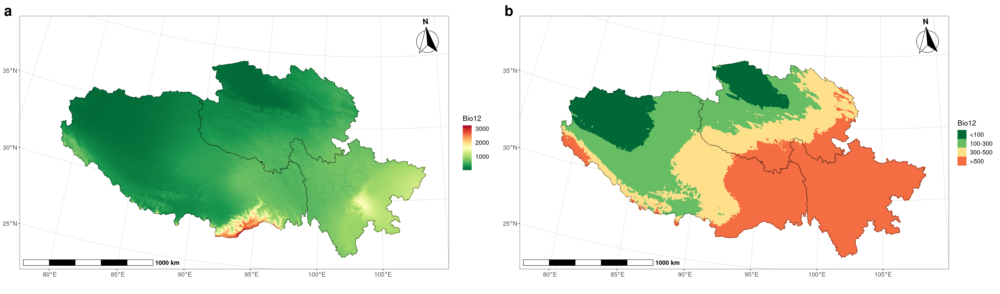

In [12]:
# Visualize the Bio12 (Mean annual precipitation) 
options(repr.plot.width = 13.43 * 2, repr.plot.height = 7.9)
q7 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
    add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$Bio12) %>% 
    add_north_arrow() %>% add_scale_bar() %>% add_crs()
q8 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
   add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$Bio12, breaks = c(100, 300, 500), labels = c("<100", "100-300", "300-500", ">500")) %>% 
   add_north_arrow() %>% add_scale_bar() %>% add_crs()
cowplot::plot_grid(q7, q8, align = 'hv', ncol = 2, labels = c("a", "b"), label_size = 28) %>% suppressWarnings()

## Collect the futrue bioclimatic variables

The `get_fut_bioc()` is implemented to download 19 future bioclimatic variables from [WorldClim](https://www.worldclim.org/) database version 2.1. You are allowed to specify a spatial resolution. Here is a simple example based on the resolution of 2.5'.

In [13]:
# Download futrue bioclimatic variables of research area
dataset.dts.aliyun %<>% get_fut_bioc(res = 2.5, out.dir = "../test/microgeo_data")

✔ [2023-10-12 10:51:16] SAVE ==> new results have been saved to: object$spa$rast$fut [19 variables; 4 groups]



In [14]:
# Show dataset 
dataset.dts.aliyun %>% show_dataset()

── The Summary of Microgeo Dataset ─────────────────────────────────────────────


! object$mat: 6808 ASVs/genes and 1244 samples [need to be subsampled!]

ℹ object$ant: 6808 ASVs/genes and 7 annotation levels (Kingdom, Phylum, Class, Order, Family, Genus, Species)

ℹ object$met: 1244 samples and 2 variables (longitude, latitude)

ℹ object$map: a SpatialPolygonsDataFrame with the CRS of '+proj=longlat +datum=WGS84 +no_defs'

ℹ object$phy: a phylogenetic tree with 6808 tip labels

ℹ object$env: 1244 samples and 10 variables




── The Summary of Biogeographic Traits ─────────────────────────────────────────


✔ object$spa: 21 historically numeric variables; 0 historically classification variables; 4 groups of future climate data




• To check the summary of dataset, Replace `object` with the variable name of your dataset
• For example, if the variable name is `dataset.dts`you can run `head(dataset.dts$met)` to check the content of `met`


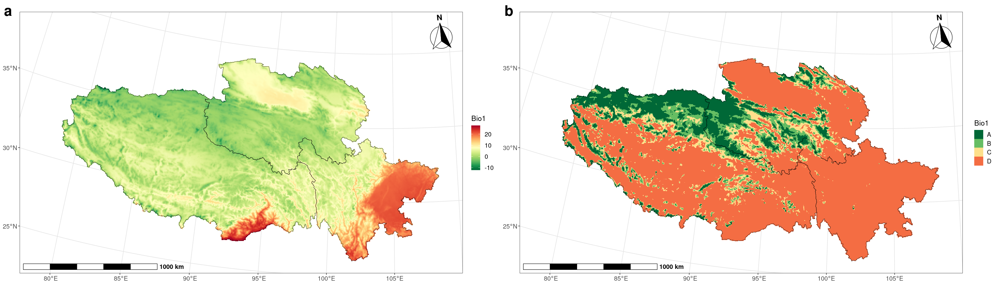

In [15]:
# Visualize the Bio1 (Mean annual temperature) of `BCC-CSM2-MR|ssp585|2061-2080` 
options(repr.plot.width = 13.43 * 2, repr.plot.height = 7.9)
q9 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
    add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$fut$`BCC-CSM2-MR|ssp585|2061-2080`$Bio1) %>% 
    add_north_arrow() %>% add_scale_bar() %>% add_crs()
q10 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
   add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$fut$`BCC-CSM2-MR|ssp585|2061-2080`$Bio1, breaks = c(-1, 0, 1), labels = c("A", "B", "C", "D")) %>% 
   add_north_arrow() %>% add_scale_bar() %>% add_crs()
cowplot::plot_grid(q9, q10, align = 'hv', ncol = 2, labels = c("a", "b"), label_size = 28) %>% suppressWarnings()

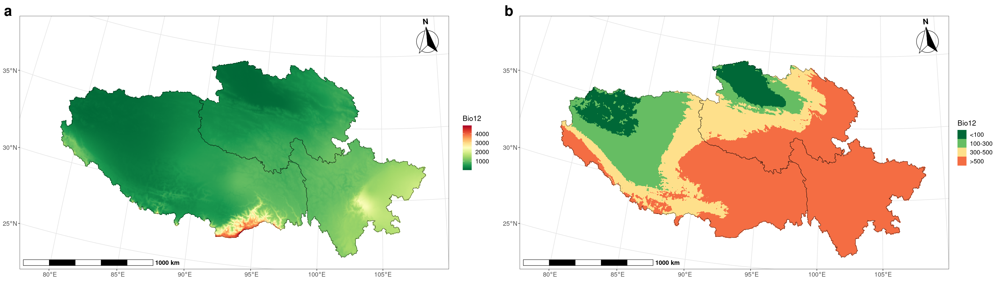

In [16]:
# Visualize the Bio12 (Mean annual precipitation) of `BCC-CSM2-MR|ssp585|2061-2080` 
options(repr.plot.width = 13.43 * 2, repr.plot.height = 7.9)
q11 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
    add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$fut$`BCC-CSM2-MR|ssp585|2061-2080`$Bio12) %>% 
    add_north_arrow() %>% add_scale_bar() %>% add_crs()
q12 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
   add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$fut$`BCC-CSM2-MR|ssp585|2061-2080`$Bio12, breaks = c(100, 300, 500), labels = c("<100", "100-300", "300-500", ">500")) %>% 
   add_north_arrow() %>% add_scale_bar() %>% add_crs()
cowplot::plot_grid(q11, q12, align = 'hv', ncol = 2, labels = c("a", "b"), label_size = 28) %>% suppressWarnings()

## Collect the numeric metrics from MODIS

The `get_modis_num_metrics()` is implemented to download numeric [MODIS](https://modis.gsfc.nasa.gov/) metrics from the [EOSDIS](https://cmr.earthdata.nasa.gov). In the current version, there are 10 avaliable metrics in microgeo R package. Running `microgeo::show_modis_num_metrics()` can display detailed infomation about these metrics. Regarding to the NDVI and ENV, you can specify a spatial resolution (meter). Here is a simple example.

In [17]:
# Download numeric metrics from MODIS
# show_modis_num_metrics()
dataset.dts.aliyun %<>% get_modis_num_metrics(username = "my.username", password = "my.passwd", date.ran = c("2019-08-01|2019-09-01", "2020-08-01|2020-09-01"),
                                              measures = c("NDVI", "EVI"), out.dir = "../test/microgeo_data")

ℹ [2023-10-12 10:51:32] INFO ==> preparing MODIS product list for searching...

ℹ [2023-10-12 10:51:32] INFO ==> searching avaliable MODIS products...

ℹ [2023-10-12 10:51:32] INFO ==> current product (1/2): MOD13A2 (NDVI|EVI--> 2019-08-01 to 2019-09-01)

ℹ [2023-10-12 10:51:36] INFO ==> current product (2/2): MOD13A2 (NDVI|EVI--> 2020-08-01 to 2020-09-01)

ℹ [2023-10-12 10:51:39] INFO ==> find 48 files with 0.97 GB in total...

ℹ [2023-10-12 10:51:39] INFO ==> downloading all avaliable MODIS products[skip if the file exists]...

ℹ [2023-10-12 10:51:39] INFO ==> preparing the PTVs (Product, Time, Version) for merging remote-sensing images...

ℹ [2023-10-12 10:51:39] INFO ==> converting hdf files to tif files...

ℹ [2023-10-12 10:51:39] INFO ==> current product (1/1): MOD13A2 (convert 48 hdf files into 12 tif files using 12 threads)

ℹ [2023-10-12 10:51:39] INFO ==> calculating average values based on date range...

ℹ [2023-10-12 10:51:39] INFO ==> current measure (1/2): NDVI_061(30 thr

In [18]:
# Show dataset 
dataset.dts.aliyun %>% show_dataset()

── The Summary of Microgeo Dataset ─────────────────────────────────────────────


! object$mat: 6808 ASVs/genes and 1244 samples [need to be subsampled!]

ℹ object$ant: 6808 ASVs/genes and 7 annotation levels (Kingdom, Phylum, Class, Order, Family, Genus, Species)

ℹ object$met: 1244 samples and 2 variables (longitude, latitude)

ℹ object$map: a SpatialPolygonsDataFrame with the CRS of '+proj=longlat +datum=WGS84 +no_defs'

ℹ object$phy: a phylogenetic tree with 6808 tip labels

ℹ object$env: 1244 samples and 10 variables




── The Summary of Biogeographic Traits ─────────────────────────────────────────


✔ object$spa: 23 historically numeric variables; 0 historically classification variables; 4 groups of future climate data




• To check the summary of dataset, Replace `object` with the variable name of your dataset
• For example, if the variable name is `dataset.dts`you can run `head(dataset.dts$met)` to check the content of `met`


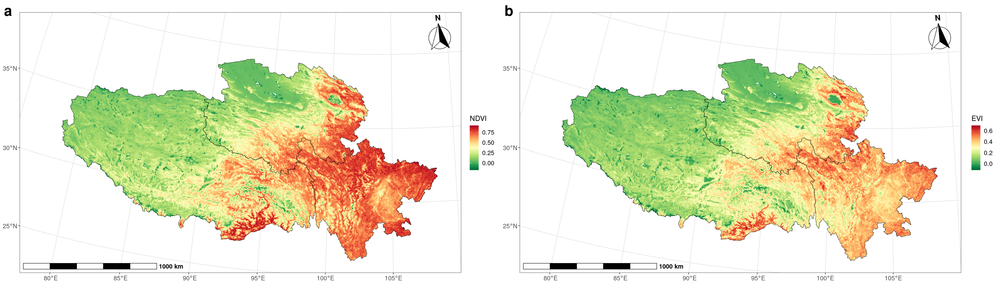

In [19]:
# Visualize the NDVI and EVI 
options(repr.plot.width = 13.43 * 2, repr.plot.height = 7.9)
q13 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
    add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$NDVI) %>% 
    add_north_arrow() %>% add_scale_bar() %>% add_crs()
q14 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
    add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$EVI) %>% 
    add_north_arrow() %>% add_scale_bar() %>% add_crs()
cowplot::plot_grid(q13, q14, align = 'hv', ncol = 2, labels = c("a", "b"), label_size = 28) %>% suppressWarnings()

## Collect the classification metrics from MODIS

The `get_modis_cla_metrics()` is used to download classification [MODIS](https://modis.gsfc.nasa.gov/) metrics from the [EOSDIS](https://cmr.earthdata.nasa.gov). In the current version, there are 11 avaliable land-cover metrics. Running `microgeo::show_modis_cla_metrics()` can display detailed infomation about these metrics. Here is a simple example.

In [20]:
# Download classification metrics from MODIS
# show_modis_cla_metrics()
dataset.dts.aliyun %<>% get_modis_cla_metrics(username = "username", password = "password", 
                                              measures = "LC_Type1", out.dir = "../test/microgeo_data") 

ℹ [2023-10-12 10:52:13] INFO ==> preparing MODIS product list for searching...

ℹ [2023-10-12 10:52:13] INFO ==> searching avaliable MODIS products...

ℹ [2023-10-12 10:52:13] INFO ==> current product (1/1): MCD12Q1 (LC_Type1--> 2021-01-01 to 2021-12-31)

ℹ [2023-10-12 10:52:15] INFO ==> find 8 files with 0.09 GB in total...

ℹ [2023-10-12 10:52:15] INFO ==> downloading all avaliable MODIS products[skip if the file exists]...

ℹ [2023-10-12 10:52:15] INFO ==> preparing the PTVs (Product, Time, Version) for merging remote-sensing images...

ℹ [2023-10-12 10:52:15] INFO ==> converting hdf files to tif files...

ℹ [2023-10-12 10:52:15] INFO ==> current product (1/1): MCD12Q1 (convert 8 hdf files into 1 tif files using 1 threads)

ℹ [2023-10-12 10:52:15] INFO ==> collecting all merged image files...

ℹ [2023-10-12 10:52:15] INFO ==> current measure (1/1): LC_Type1_061

ℹ [2023-10-12 10:52:15] INFO ==> reprojecting the CRS of SpatRaster to epsg:+proj=longlat +datum=WGS84 +no_defs, it takes 

In [21]:
# Show dataset 
dataset.dts.aliyun %>% show_dataset()

── The Summary of Microgeo Dataset ─────────────────────────────────────────────


! object$mat: 6808 ASVs/genes and 1244 samples [need to be subsampled!]

ℹ object$ant: 6808 ASVs/genes and 7 annotation levels (Kingdom, Phylum, Class, Order, Family, Genus, Species)

ℹ object$met: 1244 samples and 2 variables (longitude, latitude)

ℹ object$map: a SpatialPolygonsDataFrame with the CRS of '+proj=longlat +datum=WGS84 +no_defs'

ℹ object$phy: a phylogenetic tree with 6808 tip labels

ℹ object$env: 1244 samples and 10 variables




── The Summary of Biogeographic Traits ─────────────────────────────────────────


✔ object$spa: 23 historically numeric variables; 1 historically classification variables; 4 groups of future climate data




• To check the summary of dataset, Replace `object` with the variable name of your dataset
• For example, if the variable name is `dataset.dts`you can run `head(dataset.dts$met)` to check the content of `met`


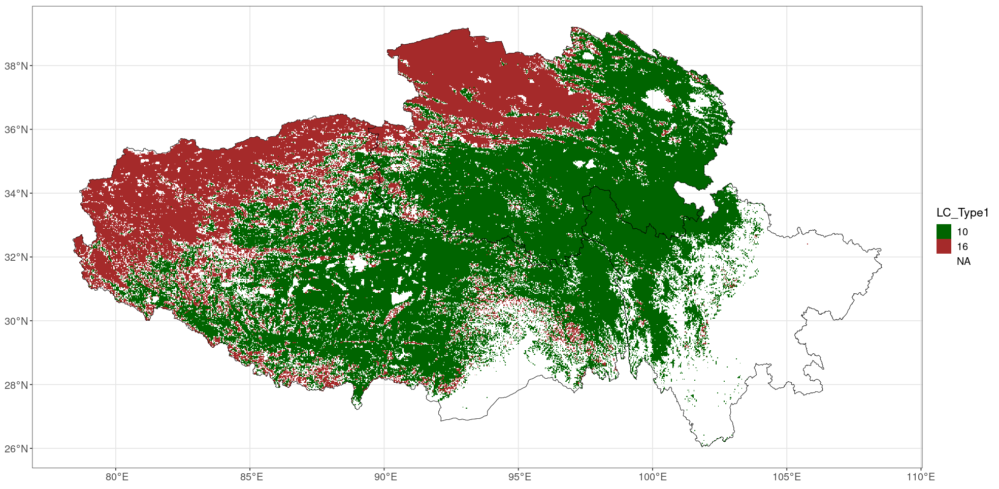

In [22]:
# Subset classification. Due to the high data resolution, it is not recommended to use `add_crs()` for visualization here. Otherwise, it may take a very long time.
options(repr.plot.width = 16.4, repr.plot.height = 8.02)
g.spat.raster <- subset_cla_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$cla$LC_Type1, use.class = c(10, 16)) # Only display grassland and barren
plot_bmap(map = dataset.dts.aliyun$map) %>% add_spatraster(spat.raster = g.spat.raster, color = c("darkgreen", "brown"))

## Collect the world soil properties

The `get_soilgrid()` is implemented to download soil metrics from [SoilGRIDS]('https://www.isric.org/explore/soilgrids'). In the current version, there are 8 avaliable metrics. Here is a simple example.

In [23]:
# Download soil metrics from the SoilGRIDS for the research region
dataset.dts.aliyun %<>% get_soilgrid(depth = 5, measures = c("bdod", "cfvo", "nitrogen", "phh2o", "soc", "ocd"), out.dir = "../test/microgeo_data") 

✔ [2023-10-12 10:53:04] SAVE ==> new results have been saved to: object$spa$rast$his$bdod

✔ [2023-10-12 10:53:11] SAVE ==> new results have been saved to: object$spa$rast$his$cfvo

✔ [2023-10-12 10:53:19] SAVE ==> new results have been saved to: object$spa$rast$his$nitrogen

✔ [2023-10-12 10:53:26] SAVE ==> new results have been saved to: object$spa$rast$his$phh2o

✔ [2023-10-12 10:53:35] SAVE ==> new results have been saved to: object$spa$rast$his$soc

✔ [2023-10-12 10:53:44] SAVE ==> new results have been saved to: object$spa$rast$his$ocd



In [24]:
# Show dataset 
dataset.dts.aliyun %>% show_dataset()

── The Summary of Microgeo Dataset ─────────────────────────────────────────────


! object$mat: 6808 ASVs/genes and 1244 samples [need to be subsampled!]

ℹ object$ant: 6808 ASVs/genes and 7 annotation levels (Kingdom, Phylum, Class, Order, Family, Genus, Species)

ℹ object$met: 1244 samples and 2 variables (longitude, latitude)

ℹ object$map: a SpatialPolygonsDataFrame with the CRS of '+proj=longlat +datum=WGS84 +no_defs'

ℹ object$phy: a phylogenetic tree with 6808 tip labels

ℹ object$env: 1244 samples and 10 variables




── The Summary of Biogeographic Traits ─────────────────────────────────────────


✔ object$spa: 29 historically numeric variables; 1 historically classification variables; 4 groups of future climate data




• To check the summary of dataset, Replace `object` with the variable name of your dataset
• For example, if the variable name is `dataset.dts`you can run `head(dataset.dts$met)` to check the content of `met`


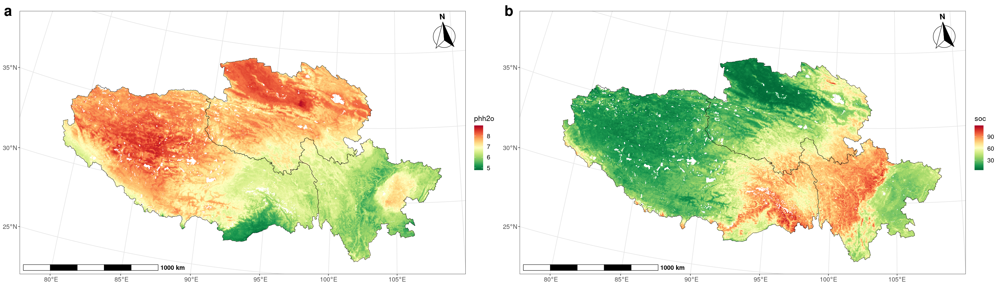

In [25]:
# Visualize the phh2o and soc
options(repr.plot.width = 13.43 * 2, repr.plot.height = 7.9)
q15 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
    add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$phh2o) %>% 
    add_north_arrow() %>% add_scale_bar() %>% add_crs()
q16 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
    add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$soc) %>% 
    add_north_arrow() %>% add_scale_bar() %>% add_crs()
cowplot::plot_grid(q15, q16, align = 'hv', ncol = 2, labels = c("a", "b"), label_size = 28) %>% suppressWarnings()

## Collect the soil properties of China

This function is used to process soil metrics downloaded from 'http://globalchange.bnu.edu.cn/research/soil2'. Due to the limitations in copyrights, the spatial data of China soil properties should be manually downloaded. Here is a simple example.

In [26]:
# Process soil metrics of CHINA for a research area
dataset.dts.aliyun %<>% get_soilcn(depth = 0.045, out.dir = "../test/microgeo_data") 

✔ [2023-10-12 10:53:59] SAVE ==> new results have been saved to: object$spa$rast$his$PH

✔ [2023-10-12 10:54:08] SAVE ==> new results have been saved to: object$spa$rast$his$SOM

✔ [2023-10-12 10:54:17] SAVE ==> new results have been saved to: object$spa$rast$his$TN

✔ [2023-10-12 10:54:26] SAVE ==> new results have been saved to: object$spa$rast$his$TP

✔ [2023-10-12 10:54:36] SAVE ==> new results have been saved to: object$spa$rast$his$TK

✔ [2023-10-12 10:54:46] SAVE ==> new results have been saved to: object$spa$rast$his$AN

✔ [2023-10-12 10:54:57] SAVE ==> new results have been saved to: object$spa$rast$his$AP

✔ [2023-10-12 10:55:07] SAVE ==> new results have been saved to: object$spa$rast$his$AK

✔ [2023-10-12 10:55:18] SAVE ==> new results have been saved to: object$spa$rast$his$CEC

✔ [2023-10-12 10:55:31] SAVE ==> new results have been saved to: object$spa$rast$his$H

✔ [2023-10-12 10:55:42] SAVE ==> new results have been saved to: object$spa$rast$his$AL

✔ [2023-10-12 10:55:

In [27]:
# Show dataset 
dataset.dts.aliyun %>% show_dataset()

── The Summary of Microgeo Dataset ─────────────────────────────────────────────


! object$mat: 6808 ASVs/genes and 1244 samples [need to be subsampled!]

ℹ object$ant: 6808 ASVs/genes and 7 annotation levels (Kingdom, Phylum, Class, Order, Family, Genus, Species)

ℹ object$met: 1244 samples and 2 variables (longitude, latitude)

ℹ object$map: a SpatialPolygonsDataFrame with the CRS of '+proj=longlat +datum=WGS84 +no_defs'

ℹ object$phy: a phylogenetic tree with 6808 tip labels

ℹ object$env: 1244 samples and 10 variables




── The Summary of Biogeographic Traits ─────────────────────────────────────────


✔ object$spa: 50 historically numeric variables; 1 historically classification variables; 4 groups of future climate data




• To check the summary of dataset, Replace `object` with the variable name of your dataset
• For example, if the variable name is `dataset.dts`you can run `head(dataset.dts$met)` to check the content of `met`


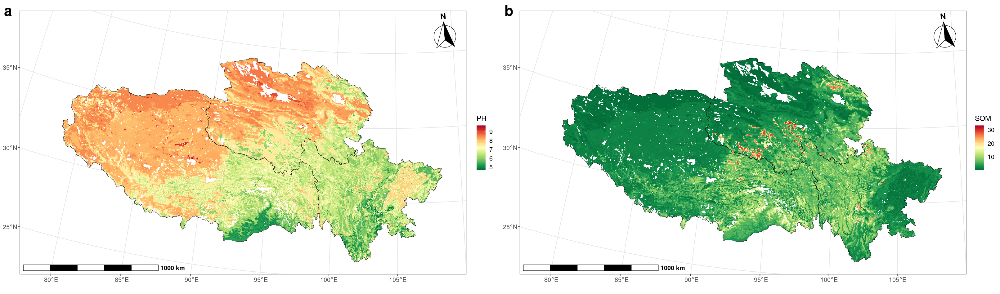

In [28]:
# Visualize the PH and SOM 
options(repr.plot.width = 13.43 * 2, repr.plot.height = 7.9)
q17 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
    add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$PH) %>% 
    add_north_arrow() %>% add_scale_bar() %>% add_crs()
q18 <- plot_bmap(map = dataset.dts.aliyun$map) %>%
    add_spatraster(spat.raster = dataset.dts.aliyun$spa$rast$his$SOM) %>% 
    add_north_arrow() %>% add_scale_bar() %>% add_crs()
cowplot::plot_grid(q17, q18, align = 'hv', ncol = 2, labels = c("a", "b"), label_size = 28) %>% suppressWarnings()

## Extract spatial data for each sample

After all spatial data have been successfully downloaded, we can use the `extract_data_from_spatraster()` function to extract these spatial data based on the latitude and longitude of the samples. Here is a simple example.

In [29]:
# Show spatial variable names before the extraction 
dataset.dts.aliyun %<>% get_spa_vars()
head(dataset.dts.aliyun$spa$unit)

,measure,unit
,<chr>,<chr>
1,ELEV,m
2,AI,
3,Bio1,degree centigrade
4,Bio2,degree centigrade
5,Bio3,degree centigrade
6,Bio4,degree centigrade


In [30]:
# Extract spatial data for samples
dataset.dts.aliyun %<>% extract_data_from_spatraster() %>% suppressWarnings() # A data.frame of historically spatial variables for each sample is avaliable at `dataset.dts.aliyun$spa$tabs`
head(dataset.dts.aliyun$spa$tabs)

! [2023-10-12 10:58:01] WARN ==> Some samples were failed to be applied for extraction. use `remove.na = FALSE` to check them!

✔ [2023-10-12 10:58:01] SAVE ==> new results have been saved to: object$spa$tabs



,LC_Type1,AI,ELEV,Bio1,Bio2,Bio3,Bio4,Bio5,Bio6,Bio7,⋯,CA,MG,K,NA,SA,SI,CL,GRAV,BD,POR
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
s1,10,0.4763,4077.8,0.05243338,14.9598,41.23052,776.2708,15.9224,-20.3608,36.2832,⋯,0.4636,1.917,0.352,0.352,38.32,47.61,14.07,0,1.263,45.97
s2,10,0.4763,4077.8,0.05243338,14.9598,41.23052,776.2708,15.9224,-20.3608,36.2832,⋯,0.4636,1.917,0.352,0.352,38.32,47.61,14.07,0,1.263,45.97
s3,10,0.4763,4077.8,0.05243338,14.9598,41.23052,776.2708,15.9224,-20.3608,36.2832,⋯,0.4636,1.917,0.352,0.352,38.32,47.61,14.07,0,1.263,45.97
s4,10,0.4763,4077.8,0.05243338,14.9598,41.23052,776.2708,15.9224,-20.3608,36.2832,⋯,0.4636,1.917,0.352,0.352,38.32,47.61,14.07,0,1.263,45.97
s5,10,0.4763,4077.8,0.05243338,14.9598,41.23052,776.2708,15.9224,-20.3608,36.2832,⋯,0.4636,1.917,0.352,0.352,38.32,47.61,14.07,0,1.263,45.97
s6,10,0.4874,4103.2,-0.04426666,14.9932,41.31165,775.4506,15.8096,-20.4832,36.2928,⋯,0.4636,1.917,0.352,0.352,38.32,47.61,14.07,0,1.263,45.97


In [31]:
# Check sample numbers 
dim(dataset.dts.aliyun$spa$tabs)

[1] 1089   51

In [32]:
# Finally, we tidy up the dataset again 
dataset.dts.aliyun %<>% rarefy_count_table()
dataset.dts.aliyun %<>% tidy_dataset()
dataset.dts.aliyun %>% show_dataset()

ℹ [2023-10-12 10:58:03] INFO ==> the ASV/gene abundance table has been rarefied with a sub-sample depth of 5310



── The Summary of Microgeo Dataset ─────────────────────────────────────────────


ℹ object$mat: 6807 ASVs/genes and 1089 samples [subsample depth: 5310]

ℹ object$ant: 6807 ASVs/genes and 7 annotation levels (Kingdom, Phylum, Class, Order, Family, Genus, Species)

ℹ object$met: 1089 samples and 2 variables (longitude, latitude)

ℹ object$map: a SpatialPolygonsDataFrame with the CRS of '+proj=longlat +datum=WGS84 +no_defs'

ℹ object$phy: a phylogenetic tree with 6807 tip labels

ℹ object$env: 1089 samples and 10 variables




── The Summary of Biogeographic Traits ─────────────────────────────────────────


✔ object$spa: 50 historically numeric variables; 1 historically classification variables; 4 groups of future climate data




• To check the summary of dataset, Replace `object` with the variable name of your dataset
• For example, if the variable name is `dataset.dts`you can run `head(dataset.dts$met)` to check the content of `met`
